# LIME : Local Interpretable Model-agnostic Explanation

블랙박스 모형 $f$를 학습데이터에 적합시킨 후, $i$번째 표본의 설명변수 $x_i$를 입력하면 예측값 $f(x_i)$를 출력하게 된다. 이때 각 설명변수 값들을 약간씩 흔들어주면 이에 따라 예측치 $f(x_i)$값도 변경될 것이다. 그리고 설명변수 별로 같은 강도로 값을 흔들어 주더라도 각 설명변수의 예측치 $f(x_i)$에 대한 영향은 다를 것이다.

선형모형
$$
f(x_i) = \beta_{0} + \beta_{1}x_{1i} + \dots + \beta_{p}x_{pi}
$$
을 예로 설명하면 $x_{1i}$을 약간씩 흔들어 주면 $f(x_i)$는 $\beta_{1}x_{1i}$ 만큼 움직일 것이고 $x_{ki}$를 흔들어 주면 $f(x_i)$는 $\beta_{k}x_{ki}$만큼 변동할 것이다. 그러나 블랙박스 모형의 입력이 text,image, genomics와 같이 고차원인 경우 설명변수를 하나씩 변경하여도 계산 부담의 문제와 **예측치의 변동이 거의 일어나지 않을 가능성**도 높고, 예측치의 변화를 사람의 눈으로 인식하여 해석하는 것은 불가능할 것이다.

**LIME(Local Interpretable Model-agnostic Explanation)** 은 설명변수의 개수가 작은 경우에도 적용이 가능하지만, 고차원인 경우 매우 유용하게 사용할 수 있는 설명변수 explainer이며 표본별로 설명변수의 중요도를 측정하는 local explainer이다. LIME은 $i$번째 표본의 설명변수를 N번 **흔들어 주어(perturb)** N개의 설명변수를 만든 후, 학습된 블랙박스 모형에 입력하여 N개의 예측값을 만든다. 이렇게 만든 N개의 (설명변수,예측값)을 합성데이터(Synthetic data)라고 한다. $i$번째 표본의 설명변수들의 중요도를 구하므로 N개의 합성 설명변수가 원래의 설명변수와 가까울수록 가중치를 많이 부여한다.  
선형회귀모형이나 의사결정나무를 가중치가 부여된 합성데이터에 적용하여 선형회귀인 경우엔 추정된 모수, 의사결정나무는 information gain으로 표본별 설명변수 중요도를 계산한다. 이러한 유리박스 모형을 **대리모형(Surrogate Model)** 이라고 한다.

LIME은 LASSO 모형을 대리모형으로 하여 가장 중요한 K개의 설명변수(TOP-K)의 중요도를 추정된 계수의 절댓값 크기로 산출한다. 대리모형은 적용하는 표본마다 다르므로(선형회귀모형이면 적합한 표본마다 다른 모수가 추정되므로) 대리모형을 블랙박스의 표본점인 접선(tangent)으로 해석하기도 한다. 이러한 해석을 최대한 충족시키기 위해 합성데이터의 각 설명변수가 원래의 설명변수에 가까울수록 가중치를 많이 부여한다. 그러므로 중요한 설명변수는 약간만 변동을 주어도 가중치가 크므로 예측값이 크게 흔들릴 것이다.

LIME의 손실함수는
$$
L(f,g,w(x^{＊}))+\Omega (g)
$$
로 정의되고 이 손실함수를 최소로 하는 유리박스 모형인 대리모형 $g$를 구하는 것이 LIME의 목표이다. 여기서 $f$는 블랙박스 모형이고 $w(x^{＊})$는 합성된 설명변수에 부여된 가중치이며 $\Omega(g)$는 대리모형의 복잡도에 대한 손실함수이다. 손실함수 $L$은 $f$의 예측치와 $g$의 예측값과의 거리 측도로, 예를 들어 $g$가 선형회귀모형이면 MSE, 의사결정나무이면 information gain 등이 대표적인 예이다. 물론 $f$와 $g$의 예측값은 합성된 설명변수들을 입력하여 구한 예측값들이다. 일반적으로 $g$의 복잡도는 미리 결정하므로(L1 규제화를 통해 0이 아닌 k개의 설명변수 또는 이미 결정한 top-k 설명변수) 실제적으로 LIME의 손실함수는  
$$
L(f,g,w(x^{＊}))
$$
으로 줄어든다. 그러므로 LIME의 핵심은 어떻게 합성데이터를 생성하고 각 합성데이터에 어떤 가중치에 부여하느냐이다. 합성데이터의 생성은 tabular, text, image 데이터 등의 데이터 형태에 따라 다르게 정의된다.

---

## 데이터에 따른 LIME의 적용
LIME을 적용하기 위해서는 먼저 lime 모듈을 설치한다.

### Tabular 데이터
Tabular 데이터는 행은 표본의 크기, 열은 설명변수로 구성된 Tabular 형태의 데이터를 말한다. 편의를 위해 대리모형 $g$를 LASSO라고 가정한다. Tabular 데이터에서 합성데이터의 생성과 local 설명변수 중요도는 다음과 같이 구하게 된다.

$(1)$. 관심있는 표본을 선택하고, 이 표본의 설명변수값을 $x^{＊}$로 표기한다.  

$(2)$. 블랙박스 모형을 학습시킨 학습데이터로부터 각 설명변수의 평균과 분산을 계산한다.  

$(3)$. 앞에서 구한 평균과 분산을 가진 정규분포로부터 각 설명변수를 임의추출한다.  

$(4)$. $(3)$번 step에서 임의추출된 설명변수를 $f$에 입력하여 그 예측값을 목적값 $y$로 정의한다.  

$(5)$. $(3)$과 $(4)$ step을 N번 반복하여 N개의 합성데이터를 생성한다.  

$(6)$. 원래의 설명변수 $x^{＊}$와 합성데이터의 설명변수의 거리를 구한다. 일반적으로 **RBF(radial basis function)** 를 적용하여 거리를 산출하여 이를 합성데이터 표본점들의 가중치로 정의한다.  

$(7)$. 합성데이터에 대리모형인 가중 LASSO 모형을 적용하여 가장 큰 k개의 회귀계수를 구하고 이 k개의 회귀계수를 top-k 설명변수 중요도로 정의한다.

위의 절차에서 볼 수 있듯이 LIME의 설명변수 중요도는 설명변수가 변하면 블랙박스 모형의 예측값이 얼마나 변하는지를 보여주는 측도이다. 직관적으로 LIME을 설명하면 **합성된 설명변수에 의해 특정 설명변수 값이 변하더라도 예측치가 변하지 않으면 LASSO 모형에서 이 회귀계수는 거의 0에 가깝게 된다는 사실**을 이용한 것이다.  
Tabular 데이터에 적용된 LIME의 가장 큰 문제는 $(6)$번 step에서 RBF의 width의 결정이다. 이 width는 정규분포의 표준편차로 해석되므로 width가 작을수록 원래 설명변수에 가까운 합성 설명변수에 가중치를 많이 주게 된다. 그러므로 HyperParameter인 width를 어떤 값으로 주느냐에 따라 때떄로 대리모형인 LASSO 회귀계수의 부호도 바뀌는 현상이 발생할 수도 있다. $(7)$번 step에서 설명변수의 중요도가 상위 k개인 설명변수의 선택은 LASSO 모형의 L1 규제화 값을 점차적으로 증가시켜 0이 아닌 회귀계수가 k개가 되도록 조절하여 선택한다.

### Text 데이터
text 데이터와 다음에 설명할 image 데이터에 대한 합성데이터의 생성은 tabular와 다르다. Text 데이터 표본에 나타난 text를 말뭉치(corpus)로 분리한 후, 표본에 나타난 말뭉치의 빈도나 index를 딥러닝 모형에 입력하여 NLP task를 수행한다. 여기에 대응하는 유리박스 모형을 위한 설명변수는 1 또는 0의 값을 갖도록 정의한다. **1**은 설명변수 말뭉치가 합성 설명변수에 존재한다는 의미이고, **0**은 존재하지 않는다는 의미이다. 즉, 유리박스 모형을 위한 합성 설명변수는 원래 표본 말뭉치를 on/off 개념으로 정의하게 된다.

예를 들어  
<div align='center'>
"Hi ya babe x u 4goten bout me"
</div>

라는 문장이 spam인지 아닌지를 구별하기 위해 사용되는 표본이라고 하면, 이 표본은 총 8개의 단어로 구성된 것을 알 수 있다. 해당 표본은 유리박스 모형의 관점에서는
$$
z=[1,1,1,1,1,1,1,1]
$$
으로 합성 설명변수를 정의할 수 있다. 이를 기반으로 LIME의 설명변수 중요도를 구현하는 대리모형을 위한 합성 설명변수 예는 다음 표와 같다.

<center>

| 합성 설명변수 id | Hi | ya | babe | x | u | 4goten | bout | me | 가중치 |
| :------------: | :-:| :-:| :--: |:-:|:-:| :----: | :--: |:-: | :---: |
|        0       |  1 | 1  |  1   | 1 | 1 |    1   |   1  | 1  |    1  |
|        1       |  0 | 1  |  0   | 1 | 0 |    1   |   1  | 1  |   5/8 |
|        2       |  1 | 0  |  0   | 0 | 1 |    0   |   0  | 1  |   5/8 |

</center>

표에서 볼 수 있듯이 8개의 설명변수인 말뭉치를 on/off 형태로 합성 설명변수 $z$를 생성하고 있다. 두 번째 합성 설명변수(id=1)에 대응하는 대응하는 블랙박스 모형의 입력 설명변수 x는  
<div align='center'>

"&lt;unk&gt; ya &lt;unk&gt; x &lt;unk&gt; 4goten bout me"

</div>
으로 변경된다. 여기서 <unk>는 unknown으로 언어모형에서 oov(out of vocabulary)일 때 사용하는 말뭉치이다. 그러므로 대리모형의 합성 설명변수의 생성은 블랙박스 모형의 설명변수(말뭉치)를 임의로 추출하여 이에 대응하는 합성 설명변수는 값 1을 부여하고 나머지 말뭉치를 값 0을 부여하면 된다. 원래의 말뭉치와의 거리로 측정되는 합성변수의 가중치는 1의 비율로 계산된다. 위의 표에서 $z_1$의 가중치는 1의 비율로 5/8이며 $z_2$는 1의 비율이 3/8이므로 가중치는 3/8이 된다.

정리하자면 다음과 같다.

$(1)$. 관심있는 표본 text 자료를 선택한다.  

$(2)$. 표본 text를 구성하는 말뭉치를 임의로 선택하여 합성 설명변수 z와 대응하는 블랙박스 설명변수 x를 생성한다.

$(3)$. 블랙박스 모형에 x를 입력하여 예측값 y을 생성한다.  

$(4)$. $(2)$,$(3)$번 step을 N번 반복하여 N개의 합성데이터 (z,y)를 생성한다.  

$(5)$. 1의 비율로 합성데이터 각각의 가중치를 계산한다.  

$(6)$. 합성데이터에 대리모형을 적합하여 z의 회귀계수로 표본 text 자료의 말뭉치 중요도를 정의한다.

### Image 데이터
Image 데이터의 설명변수는 픽셀이므로 블랙박스 모형에 입력되는 설명변수 수는 매우 많지만, **픽셀 하나가 가지는 예측치에 대한 기여도는 매우 작다는 특징**을 가지고 있다. 이러한 이유로 픽셀의 그룹화인 super-pixel로 유리박스 모형의 합성 설명변수를 생성하게 된다. **super-pixel** 은 이미지 내의 객체 간 의미 있는 경계선을 찾아 아래의 오리말 이미지와 같이 픽셀을 그룹화한 것을 말하며 이러한 super-pixel은 super-pixel 알고리즘을 통해 구현된다.

대리모형의 합성 특성 변수는 다음 그림과 같은 super pixel을 기초로 하여 text 자료에서 논의된 1 또는 0으로 구성된 $z$로 정의한다. 즉, super-pixel을 임의로 뽑아 1값을 부여하고 뽑히지 않은 super-pixel은 이미지에서 제거하여 0의 값을 부여한다.

<div style="text-align: center;">
    <img src="https://ema.drwhy.ai/figure/duck_horse_06.png" alt="Example Image" width="700">
    <p style="font-style: italic; text-align: center;">출처: https://ema.drwhy.ai/figure/duck_horse_06.png</p>
</div>


다음 그림은 super-pixel을 임의로 뽑아 생성한 블랙박스 모형의 설명변수를 보여준다.

<div style="text-align: center;">
    <img src="https://ema.drwhy.ai/figure/duck_horse_process.png" alt="Example Image" width="900">
    <p style="font-style: italic; text-align: center;">출처: https://ema.drwhy.ai/figure/duck_horse_process.png</p>
</div>


대리모형의 합성 설명변수 값 0에 대응하는 블랙박스 모형의 설명변수(pixel) 값은 일반적으로 0(검은색) 또는 입력 이미지의 평균값으로 대체한다. 위의 그림은 흰색(255)로 대체한 경우를 보여준다. super-pixel을 기준으로 합성변수 z를 생성하고 설명변수 중요도는 super-pixel이 예측값에 미치는 영향으로 측정된다는 것을 제외하고 text 자료의 LIME 절차와 동일하다.

---

## SP-LIME
LIME의 설명변수 중요도를 이용하여 블랙박스 모형의 특성을 대표하는 표본 데이터 셋을 추출할 수 있다. $w_{ij}$를 LIME으로 $i$번째 표본에서 구한 $j$번째 설명변수의 중요도라고 정의하면 다음과 같은 절차로 대표성을 갖는 데이터셋을 구할 수 있다.  
이를 **SP-LIME(Submodular-Pick LIME)** 이라고 한다.

$(1)$ 대표성을 갖는 표본 수를 B로 지정한다.  

$(2)$ n개의 표본을 임의로 뽑아 $w_{ij}$를 계산한다. 여기서 $n\gt B$, $i=1,2,...,n$이고 $j=1,2,..,k$이며 k는 설명변수의 수이다.  

$(3)$ $I_j=\sqrt{\sum_{i=1}^{n}\left|w_{ij}\right|}$, $j=1,2,..k$를 계산하고 $V=\left\{  \right\}$에 저장한다.  

$(4)$ $I_j$의 집합 $C_{V\cup i} =\{ I_j : w_{\ell j} > 0, \text{ for all } \ell \in V \} \cup \{ I_j : w_{ij} > 0 \}$를 계산한다. 단 $i \notin V$이다.

$(5)$ $C_{V\cup i}=\sum_{j\in C_{V\cup i}}^{}I_j$를 계산하여 $max_iC_{V\cup i}$를 만족하는 표본 $i$를 $V$에 넣어 $V=V\cup i$로 $V$를 업데이트한다.  

$(6)$ $(4),(5)$번 step을 $V$의 크기가 $B$가 될 때까지 반복한다.

간단한 예제를 통해 위의 6개 절차를 이해해본다. 다음 표는 $(2)$번 step에서 LIME으로 계산한 $w_{ij}$라고 가정한다. 계산의 편의를 위해 $w_{ij}=1$ 또는 0 값으로 갖는 것으로 가정하고 $B=3$이라고 가정한다.

<center>


| 표본 | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ |
|:----:|:--:|:--:|:----:|:----:|:----:|
| 1    | 1  | 1  | 0  | 0  | 0  |
| 2    | 0  | 1  | 1  | 0  | 0  |
| 3    | 0  | 1  | 1  | 0  | 0  |
| 4    | 0  | 0  | 0  | 1  | 1  |

</center>


다음 표로 설명변수 값을 보면 $I_1=1$, $I_2=3$, $I_3=2$, $I_4=1$, $I_5=1$이 된다. $x_2$가 가장 중요한 변수임을 알 수 있다. 첫 반복에서 $V=\emptyset$ 이므로 $(3)$,$(4)$번 step을 이용하여
$$
C_1=\left\{ I_1,I_2 \right\},C_2=\left\{ I_2,I_3 \right\}, C_3=\left\{ I_2,I_3 \right\}, C_4=\left\{ I_4,I_5 \right\}
$$
이다. 예를 들어 $C_1$은 표본 $i=1$일 때이고, $w_{11}$과 $w_{12}$만 0보다 크므로 $C_1=\left\{ I_1,I_2 \right\}$가 된다.

$$
c_1=4,c_2=5,c_3=5,c_4=2
$$
가 된다. $c_2$와 $c_3$가 가장 큰 값이므로 2번째 또는 3번째 표본이 $V$에 들어간다. 우리의 예에서는 2번째 표본을 선택한다. 그러므로 $V=\left\{2\right\}$가 된다.

우리의 예에서는 2번째 표본을 선택한다. 그러므로 $V=\left\{2\right\}$가 된다. $(4)$번 step에 의해
$$
C_{2\cup1}=\left\{ I_1,I_2,I_3 \right\},\ C_{2\cup3}=\left\{ I_2,I_3 \right\}, \ C_{2\cup4}=\left\{ I_2,I_3,I_4,I_5 \right\}
$$  
이므로
$$
C_{2\cup 1}=6,\ C_{2\cup3}=5,\ C_{2\cup4}=7
$$
이 된다. 그러므로 $V=\left\{ 2,4 \right\}$으로 update된다.

$$
C_{\left\{ 2,4 \right\}\cup 1}=\left\{ I_1,I_2,I_3,I_4,I_5 \right\},\ C_{\left\{ 2,4 \right\}\cup 3}=\left\{ I_2,I_3,I_4,I_5 \right\}
$$
이므로
$$
C_{\left\{ 2,4 \right\}\cup 1}=8,\ C_{\left\{ 2,4 \right\}\cup 3}=7
$$
이며 $V={2,4,1}$이 되고 B=3이므로 $(6)$번 step에 의해 알고리즘을 종료한다.

위 예제에서 볼 수 있듯이 SP-LIME은 설명변수의 중요도가 큰 표본들로 구성하되, 이 표본들이 모든 설명변수를 대표하도록 대표 표본을 구성하는 표본으로 구성한다. 표본 3은 설명변수 $x_2$와 $x_3$을 대표하는 표본이지만 표본 2가 이미 SP-LIME에 포함되었으므로 표본 3은 SP-LIME에서 제외된다.

---

## LIME의 적용과 응용
lime은 데이터의 형태에 따라 각각 `LimeTabularExplainer`,`LimeTextExplainer`,`LimeImageExplainer`를 호출하여 설명변수 중요도를 산출하게 된다.

tabular 데이터에 적용된 lime의 용법은 다음과 같은 형식과 같다.

In [ ]:
from lime import lime_tabular
#explainer = lime_tabular.LimeTabularExplainer(X,mode='regression',feature_names=feature_names)

`X` : 설명변수의 평균과 분산을 구할 데이터이며 학습데이터를 사용  
`mode` : 회귀일 경우 regression, 분류일 경우 classification 을 지정  
`feature_names` : 설명변수 명을 list로 제공

lime은 local explainer이므로 관심 있는 표본의 예측값에 대한 설명변수를 제공하여 다음과 같이 explainer_instance로 계산된다.

In [3]:
#explanation = explainer.explain_instance(x,predict_fn)

`x` : 설명변수 중요도를 구하고자 하는 표본  
`predict_fn` : 예측함수, sklearn의 모델인 경우 회귀이면 model.predict, 분류이면 model.predict_proba로 지정  
LimeTextExplainer와 LimeImageExplainer도 유사하게 사용할 수 있다.

### Tabular 데이터 적용
다음과 같이 필요한 라이브러리를 호출 후 보스턴 집값 데이터를 이용하여 13개 설명변수로 주택 가격을 예측하고자 한다.

In [230]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np

import lime

import matplotlib.pyplot as plt

참고로 유명한 데이터셋인 load_boston은 인종차별과 관련된 윤리적 이슈로 인해 더 이상 sklearn에서 제공하지 않는다. medv 열이 목적변수, y이다.

In [231]:
url = "https://raw.githubusercontent.com/selva86/datasets/master/BostonHousing.csv"
boston_df = pd.read_csv(url)
boston_df.head()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


데이터를 학습데이터와 시험데이터로 분리하고 블랙박스 모형인 LightGBM을 사용하여 모델은 훈련시킨다.

In [232]:
from sklearn.model_selection import train_test_split
X=boston_df.drop('medv',axis=1)
y=boston_df['medv']

In [233]:
feature_names=X.columns

In [234]:
X_train,X_test,y_train,y_test = train_test_split(np.array(X),np.array(y),test_size=0.1,random_state=123,shuffle=True)

In [235]:
from sklearn.linear_model import LinearRegression
from lightgbm import LGBMRegressor

lgb = LGBMRegressor()
lgb.fit(X_train,y_train);

In [236]:
print('Train R^2 score :',  lgb.score(X_train,y_train))
print('Test R^2 score :',  lgb.score(X_test,y_test))

Train R^2 score : 0.979442670706155
Test R^2 score : 0.7249485253146986


Tabular 데이터를 위한 `LimeTabularExplainer`를 호출하여 용법에 맞추어 지정해준다. feature_names를 지정해야 LIME의 결과가 설명변수 명으로 출력되어 해석이 편하다.

In [237]:
from lime.lime_tabular import LimeTabularExplainer
explainer = LimeTabularExplainer(X_train,mode='regression',feature_names=feature_names)

`.explain_instance`로 원하는 표본의 lime 설명변수 중요도를 출력한다. `num_features`는 높은 변수 중요도를 보이는 변수의 개수이며 default는 10이다.

In [238]:
print('Prediction:',lgb.predict(X_test[0].reshape(1,-1)))
print('Actual:',y_test[0])

explanation = explainer.explain_instance(X_test[0],lgb.predict,num_features=7)
explanation.show_in_notebook()

Prediction: [28.43136635]
Actual: 15.0


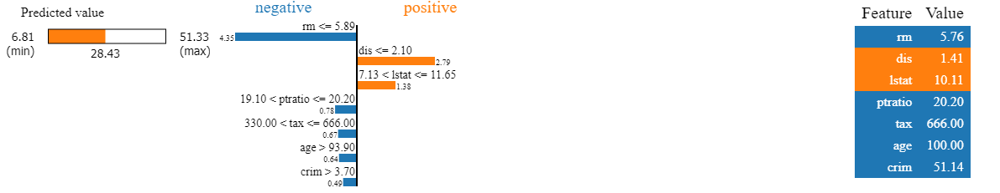

위의 출력을 보면 블랙박스 모형의 예측치는 28.43이며 실제 관측치는 15인 것을 볼 수 있다. 설명변수 중 rm,dis,lsta...순으로 설명변수 중요도를 가지고 있으며, 파란색은 음의 설명변수 중요도로 예측치에 음의 기여도, 주황색은 양의 설명변수 중요도로 예측값에 양의 기여도를 보여주고 있다. 막대그래프에 있는 수치가 설명변수 중요도이다. 막대 그래프 위에 있는 부등호와 함께 있는 숫자는 의사결정나무의 노드를 나타낸다. 위 출력의 오른쪽 Feature Value는 시험데이터셋의 첫 번째 표본의 설명변수 값이며 각 설명변수 값은 의사결정나무의 노드값 부등호를 만족하는 것을 볼 수 있다.

다음은 대리모형에 의한 예측치(local_pred)와 기존의 블랙박스 모형에 의한 예측값(predicted_value)을 보여준다.

In [76]:
print('Explanation Local Prediction :',explanation.local_pred)
print('Explanation LGBM Prediction :',explanation.predicted_value)

Explanation Local Prediction : [23.05331491]
Explanation LGBM Prediction : 28.431366346873872


다음으로 분류 예시로 넘어간다. 해당 데이터셋은 breast_cancer 데이터로 설명변수는 30개로 구성되어 있으며 악성(malignant)과 양성(benign) 종양인지 분류하기 위해 XGBoost를 사용했다.

In [78]:
from sklearn.datasets import load_breast_cancer
from xgboost import XGBClassifier

In [79]:
breast_cancer = load_breast_cancer()

In [86]:
X,y = breast_cancer.data,breast_cancer.target

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.1,stratify=y,random_state=123)

xgb = XGBClassifier()
xgb.fit(X_train,y_train);

In [88]:
print('Train Accuracy: %.2f' %xgb.score(X_train,y_train))
print('Test Accuracy: %.2f' %xgb.score(X_test,y_test))

Train Accuracy: 1.00
Test Accuracy: 0.98


분류 task 이므로 다음과 같이 `mode='classification'`으로 지정하고 Label 이름인 malignant와 benign으로 출력할 수 있도록 `class_names`를 지정한다.

In [89]:
explainer = LimeTabularExplainer(X_train,mode='classification',
                                 class_names=breast_cancer.target_names,
                                 feature_names=breast_cancer.feature_names)

다음은 시험데이터의 첫 번째 표본의 30개 설명변수 중 8개 설명변수의 중요도를 보여준다. `.explain_instance`에 xgb.predict_proba로 예측함수를 지정한다.

In [ ]:
print('Prediction : ',breast_cancer.target_names[xgb.predict(X_test[0].reshape(1,-1))[0]])
print('Actual : ',breast_cancer.target_names[y_test[0]])
explanation = explainer.explain_instance(X_test[0],xgb.predict_proba,num_features=8)
explanation.show_in_notebook()

Prediction :  malignant
Actual :  malignant


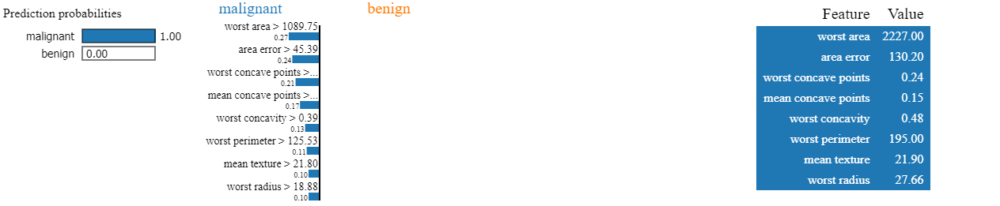

다음은 블랙박스 모형이 오분류한 표본을 추출하여 이 표본에 대한 설명변수 중요도를 보여준다. 실제로는 benign인데 malignant로 잘못 예측한 경우이다. `.explain_instance` 함수 내에 `num_sample=2000`으로 지정하여 합성 데이터를 5000개 생성하고 대리모형에 적합한 후, 이를 통해 블랙박스 모형이 malignant로 잘못 예측한 이유를 살펴볼 수 있다.

In [111]:
pred = xgb.predict(X_test)

false_preds = np.argwhere(pred != y_test).flatten()

idx = false_preds[0]

In [117]:
print('prediction: ', breast_cancer.target_names[xgb.predict(X_test[idx].reshape(1,-1))[0]])
print('Actual : ', breast_cancer.target_names[y_test[idx]])

explanation = explainer.explain_instance(X_test[idx],xgb.predict_proba,num_samples=5000,num_features=8)
explanation.show_in_notebook()

prediction:  malignant
Actual :  benign


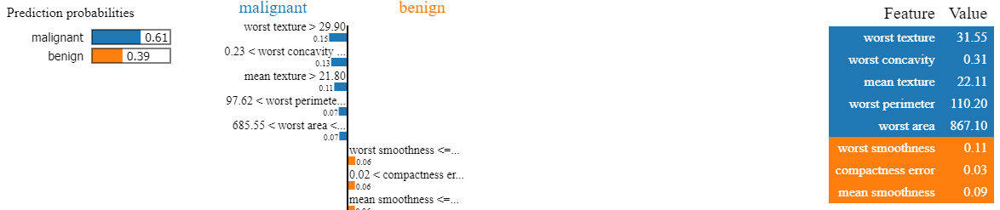

상위 5개의 변수로 인해 malignant로 오분류되는 것을 알 수 있다. 

다음은 SP-LIME을 이용하여 블랙박스 모형에 의해 X_train으로부터 설명변수 중요도 측면에서 대표성을 갖는 다섯 대의 표본(B=5)을 추출하기 위해 `num_exps_desired`로 B=5를 지정한다.

In [120]:
from lime import submodular_pick

In [121]:
sp_obj = submodular_pick.SubmodularPick(explainer,X_train,xgb.predict_proba,num_features=10,num_exps_desired=2)

sp_explanations를 이용하여 2개 표본의 클래스별 예측 확률과 설명변수 중요도를 보여준다.

In [122]:
[exp.show_in_notebook() for exp in sp_obj.sp_explanations]

[None, None, None, None, None]

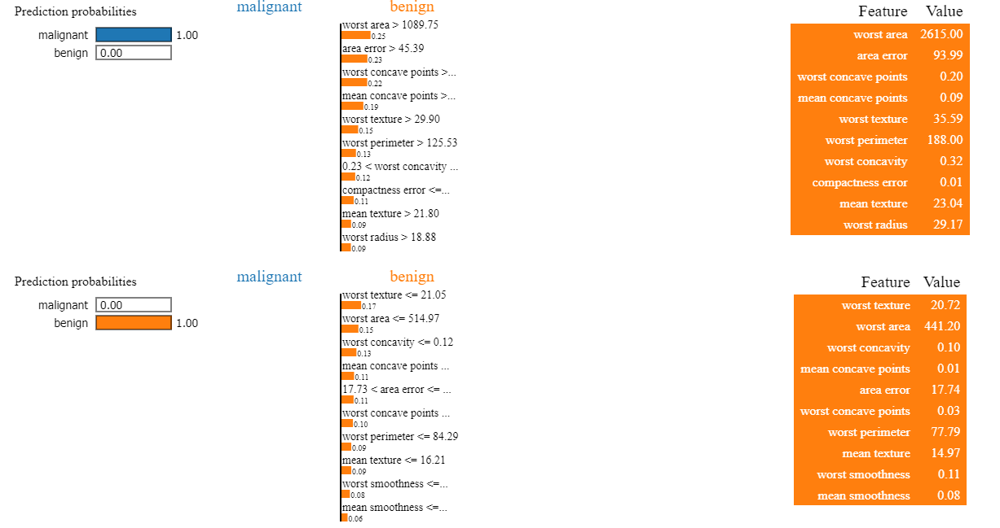

분류 label이 3개 이상인 경우에 적용된 LIME에 대해 살펴보기 위해 wine 데이터를 호출한다. 13개의 설명변수가 있으며 wine을 3개 등급(label)으로 분류하는 task이다. 마찬가지로 XGboost를 사용한다.

In [123]:
from sklearn.datasets import load_wine

In [126]:
wine = load_wine()
X,y=wine.data, wine.target

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,stratify=y,random_state=123)
print(np.unique(y_train))

[0 1 2]


In [131]:
gb=XGBClassifier()
gb.fit(X_train,y_train);

print('Train Accuracy: %.2f'%gb.score(X_train,y_train))
print('Test Accuracy: %.2f'%gb.score(X_test,y_test))

Train Accuracy: 1.00
Test Accuracy: 0.92


학습된 XGBoost를 LimeTabularExplainer에 적용하여 시험데이터에서 첫 번째 표본(X_test[0])의 설명변수 중요도를 보여주고 있다. 설명변수 중요도는 **one vs rest (ovr)** 기법으로 이항분류를 반복적으로 적용하여 보여준다. `top_labels=3`을 지정하여 설명변수 측면에서 가장 의미있는 3개의 ovr을 보여준다.

In [132]:
explainer = LimeTabularExplainer(X_train,mode='classification',
                                 class_names=wine.target_names,
                                 feature_names=wine.feature_names)

In [136]:
print('Prediction: ', wine.target_names[gb.predict(X_test[0].reshape(1,-1))[0]])
print('Actual: ', wine.target_names[y_test[0]])

explanation = explainer.explain_instance(X_test[0],gb.predict_proba,num_features=3,top_labels=3)
explanation.show_in_notebook()

Prediction:  class_1
Actual:  class_1


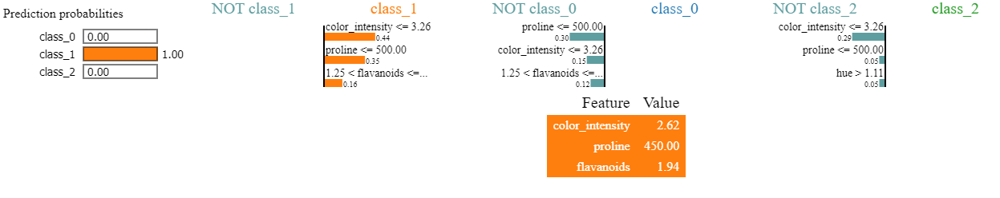

다음은 분류가 잘못 예측된 2개의 대표적 표본으로 설명하기 위해 top_labels=2를 부여하여 설명변수 중요도를 보여준다.

In [137]:
import random
preds = gb.predict(X_test)

In [144]:
false_preds = np.argwhere((preds != y_test)).flatten()
idx = random.choice(false_preds)

print('prediction :' , wine.target_names[gb.predict(X_test[idx].reshape(1,-1))[0]])
print('Actual :' , wine.target_names[y_test[idx]])

explanation = explainer.explain_instance(X_test[idx],gb.predict_proba,num_features=5,top_labels=2)
explanation.show_in_notebook()

prediction : class_0
Actual : class_1


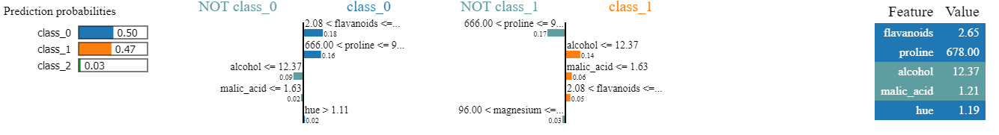

### Text 데이터 적용
SMS에 전송된 문자메시지가 spam인지 아닌지를 식별하고 각 표본에 있는 말뭉치의 예측값에 대한 중요도를 산출해본다.

In [181]:
file_path='C:\\Users\\user\\XAI\\data\\SMSSpamCollection'

with open(file_path,'rt',encoding='UTF8') as f:
    data=[line.strip().split('\t') for line in f.readlines()]

y,text = zip(*data)

In [182]:
import collections
collections.Counter(y)

Counter({'ham': 4827, 'spam': 747})

다음과 같이 spam 메시지가 747개, 정상이 4827개인 것을 볼 수 있으며 층화추출로 학습데이터와 시험데이터를 분리한다.

In [183]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(text,y,stratify=y,random_state=42,test_size=0.25)

입력된 단어를 일종의 상대빈도수인 tfidt(Term frequency inverse documents frequency)로 수량화하기 위해 `Tfidtvectorizer(analyzer='word')`를 호출하고 `randomforest`로 분류를 진행한다.

In [184]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix,classification_report

In [185]:
vectorizer=TfidfVectorizer(analyzer='word')
vectorizer.fit(X_train);

X_train_vec = vectorizer.transform(X_train)
X_test_vec = vectorizer.transform(X_test)

In [190]:
rf=RandomForestClassifier()
rf.fit(X_train_vec,y_train);

In [191]:
print('Train Accuracy: %.2f' %rf.score(X_train_vec,y_train))
print('Test Accuracy: %.2f' %rf.score(X_test_vec,y_test))

Train Accuracy: 1.00
Test Accuracy: 0.97


다음은 `LimeTextExplainer`를 이용하여 class_names를 지정하고 explainer를 동기화한다.

In [192]:
from lime import lime_text

In [193]:
explainer = lime_text.LimeTextExplainer(class_names=['ham','spam'])

다음 코드는 표본의 설명변수 중요도를 산출하기 위한 .explain_instance 함수에 지정할 예측함수를 정의한다. 텍스트를 입력하여 tfidt로 수량화한 후 ,random forest로 예측한 범주별 확률을 출력하는 맞춤형 예측함수이다. 만약 classifier=rf.predict_proba로 정의하면 설명변수의 값이 tfidt 값으로 입력되므로 해석이 불가능하다. 따라서 아래와 같이 pred_fn()의 입력은 text 자료가 되도록 정의하고 출력은 numpy 범주확률이 되도록 한다.

In [194]:
def pred_fn(text):
    text_transformed = vectorizer.transform(text)
    return rf.predict_proba(text_transformed)

pred_fn(X_test[:2])

array([[1.  , 0.  ],
       [0.49, 0.51]])

시험데이터의 두 번째 표본을 입력하면 블랙박스 모형은 0.51 확률로 두 번째 표본을 spam으로 분류하며 정분류이다. 동시에 spam으로 분류하도록 기여도가 높은 던어들은 주황색으로 중요도 순으로 출력하며 기여도가 높을수록 text에서 더 진한 색으로 나타난다. 기여도가 역방향으로 작동하는 말뭉치는 파란색으로 표시된다.

In [196]:
print('Actual Text: ',X_test[1])

print('Prediction :', rf.predict(X_test_vec[1].reshape(1,-1)[0]))
print('Actual :', y_test[1])

explanation=explainer.explain_instance(X_test[1],classifier_fn=pred_fn)
explanation.show_in_notebook()

Actual Text:  "URGENT! This is the 2nd attempt to contact U!U have WON £1000CALL 09071512432 b4 300603t&csBCM4235WC1N3XX.callcost150ppmmobilesvary. max£7. 50"
Prediction : ['spam']
Actual : spam


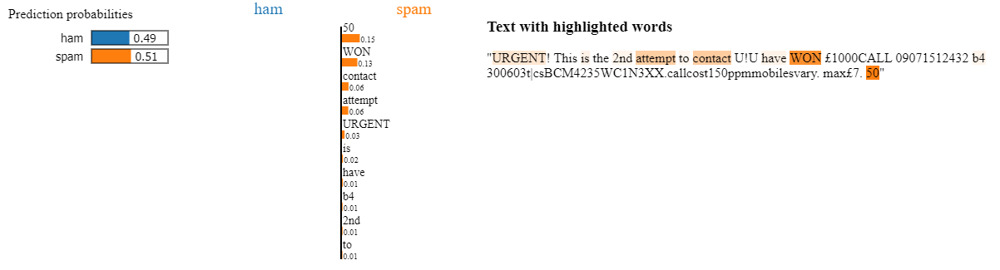

다음은 모형이 spam을 ham으로 잘못 예측한 표본을 추출하여 설명변수 중요도를 보여준다. 블랙박스 모형과 다르게 대리모형으로 평가된 설명변수 기여도는 spam에 몰려 있는 것을 볼 수 있다. 이는 해당 표본이 블랙박스 모형의 분류 경계선상에 있다고 평가할 수 있다.

In [206]:
preds=rf.predict(X_test_vec)

false_preds=np.argwhere((preds!=y_test)).flatten()
idx = random.choice(false_preds)

print('Actual Text:',X_test[idx])
print('Prediction:',rf.predict(X_test_vec[idx].reshape(1,-1)[0]))
print('Actual:', y_test[idx])

explanation = explainer.explain_instance(X_test[idx],classifier_fn=pred_fn)

explanation.show_in_notebook()

Actual Text: Kit Strip - you have been billed 150p. Netcollex Ltd. PO Box 1013 IG11 OJA
Prediction: ['ham']
Actual: spam


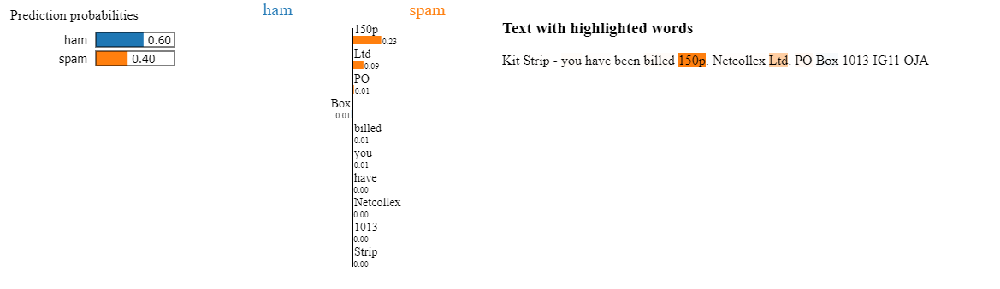

### Image 데이터 적용

LIME에서 image 데이터의 설명변수는 super-pixel 이미지이며 이러한 super-pixel 이미지의 예측치에 대한 기여도는 `LimeImageExplainer`로 구현한다. 블랙박스 모형으로 사전학습된 Intercept_V3 모형을 이용한다. Intercept_V3는 ImageNet 데이터 셋을 학습한 모형으로 입력된 이미지를 1000개의 범주로 분류하는 사전학습 모형이다. 아래 코드와 같이 dog_cat.jpg를 호출하여 이미지 크기를 (299,299,3)으로 조절한 후, convert_to_tensor로 image 데이터를 텐서 데이터로 전환하여 이미지를 출력한다. 이미지의 크기를 (299,299,3)으로 조절한 이유는 Intercept_V3의 입력 텐서의 크기가 (299,299,3)이기 때문에 (1,299,299,3)으로 reshape한 이유는 tf.keras에서 image 데이터는 4D 텐서로 입력해야 하기 때문이다.

In [249]:
import tensorflow as tf
import matplotlib.pyplot as plt
#%matplotlib inline
from PIL import Image

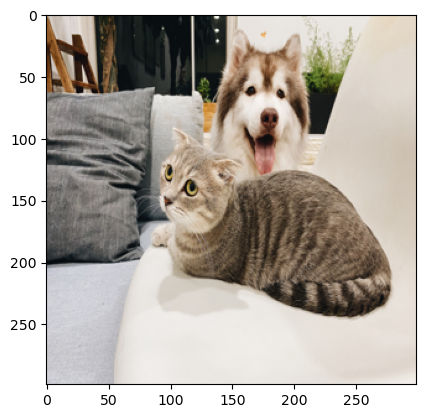

In [250]:
img = Image.open('C:/Users/user/XAI/data/dog_cat.jpg')
image = img.resize((299,299))
image = tf.convert_to_tensor(image)

plt.imshow(image)
image=np.reshape(image,(1,299,299,3))

다음은 Intercept_V3를 호출하여 모형을 fine-tuning 하지 않고 학습된 모수를 FC(fully connected) 층까지 그대로 사용하기 위해 include_top=True를 지정한다. 앞에서 정의된 이미지텐서가 정수이므로 functional API의 Input층을 dftype=tf.uint8로 지정하고 Inception_V3의 입력은 실수로 입력해야 하기 때문에 설명변수를 실수로 전환한다.

In [251]:
v3=tf.keras.applications.inception_v3.InceptionV3(include_top=True,weights='imagenet')
input_image = tf.keras.Input([None,None,3],dtype=tf.uint8)
X = tf.cast(input_image,tf.float32)
X = tf.keras.applications.inception_v3.preprocess_input(X)
X = v3(X)
model = tf.keras.Model(inputs=input_image,outputs=X)

이미지를 입력하여 출력확률을 오름차순으로 정리한 후, 가장 큰 확률을 가진 5개의 범주는 다음과 같다. 참고로 label 249는 말라뮤트, 281은 태비 고양이를 의미한다.

In [252]:
preds=model.predict(image)

for x in preds.argsort()[0][-5:]:
    print(x, preds[0,x])

1/1 [==============================] - 2s 2s/step
250 0.015409573
282 0.016838722
281 0.021715475
248 0.040528838
249 0.7147621


다음은 image 크기를 4D 텐서에서 3D 텐서로 전환해준다. .explain_instance에서 입력이미지는 3D 컬러이미지만 가능하기 때문이다. 그러므로 만약 입력이미지가 흑백이면 컬러이미지로 전환 후 입력해야 한다.

In [253]:
image = image[0]

from lime import lime_image
explainer = lime_image.LimeImageExplainer()

이제 이미지를 `LimeImageExplainer`에 적용하여 super-pixel의 예측값에 대한 기여도를 구해본다. 아래의 .explain_instance에서 classifier_fn은 label 확률을 입력받아야 하므로 model.predict를 지정해준다. Inception_V3의 출력은 각 범주에 속할 확률이기 때문이다. top_labels=5로 지정하여 1000개의 범주 중 확률이 가장 높은 5개의 범주만 출력하도록하고 hide_color = 0은 대리모형의 설명변수가 0, 즉 turn-off된 super-pixel을 검은색(0)으로 하도록 지정하고 있다. 만약 hide_color=None으로 지정하면 표본 이미지에 있는 평균색으로 turn-off된 super-pixel을 표현하게 된다. num_samples는 대리모형을 학습시키기 위한 헙성데이터의 크기를 의미하며 default=1000이다.

In [259]:
import os
import sys
sys.stdout = open(os.devnull, 'w')

explanation = explainer.explain_instance(image,model.predict,top_labels=5,hide_color=0,num_samples=3000);
sys.stdout = sys.__stdout__

  0%|          | 0/3000 [00:00<?, ?it/s]

다음은 예측값에 기여도가 높은 super-pixel을 표현하는 데 유용한 mark_boundaries를 호출한다. mark_boundaries(A,B)는 A 이미지에 mark인 B를 겹쳐서 출력하게 하는 함수이다. 아래와 같이 get_image_and_mask의 첫 번째 옵션은 설명할 label을 지정하고 두 번째 옵션은 postitive_only=True를 지정하여 양의 기여도를 갖는 super_pixel만 mask하여 출력하도록 한다. hide_rest=True를 지정하면 .explain_instance에 지정된 hide_color에 따라 turn-off된 super-pixel의 색을 표현한다. temp는 원래 이미지이고 mask는 mask된 super-pixel을 출력하게 된다. mask_boundaries(temp/225,mask)로 원래 이미지를 0~1 사이의 실수값으로 변환한 이미지 위에 top-k개의 양의 기여도를 갖는 super-pixel을 겹쳐서 출력하도록 한다.

아래 그림에서 볼 수 있듯이 말라뮤트 얼굴에 집중된 5개의 super-pixel이 highlight 되어 있으며 turn-off된 super-pixel은 검은색으로 표현되어 있다.

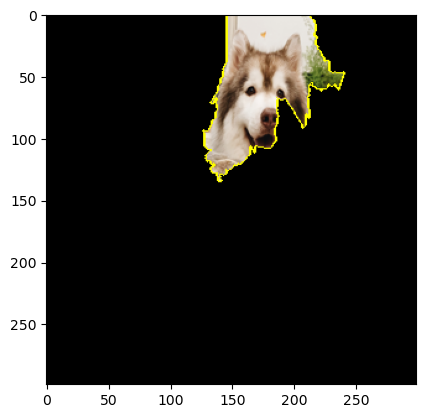

In [223]:
from skimage.segmentation import mark_boundaries

temp, mask =explanation.get_image_and_mask(249,positive_only=True,num_features=5,hide_rest=True)

plt.imshow(mark_boundaries(temp/255, mask))

다음은 hide_rest=False로 수정하여 turn-off된 super-pixel들이 원래 이미지를 갖도록 하여 출력하고 있다.

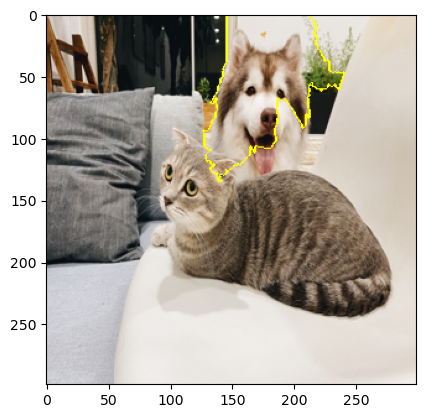

In [225]:
temp,mask=explanation.get_image_and_mask(249,positive_only=True,num_features=5,hide_rest=False)
plt.imshow(mark_boundaries(temp / 255, mask))

다음은 태비 고양이를 의미하는 label 281에 대해 그린 그림으로, 고양이 얼굴에 양의 기여도를 갖는 super-pixel이 집중된 것을 볼 수 있다.

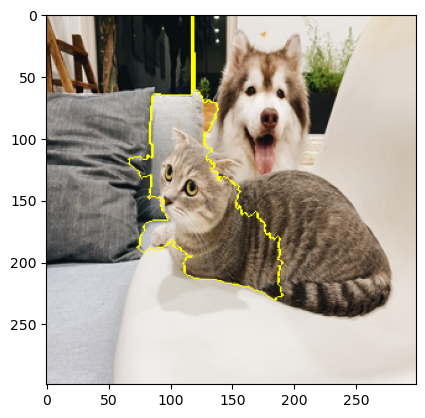

In [229]:
temp,mask = explanation.get_image_and_mask(281,positive_only=True,num_features=5,hide_rest=False)
plt.imshow(mark_boundaries(temp / 255, mask))